In [1]:
import os
# Use GPU
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [2]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import IPython.display as ipyd
import scipy.misc
from libs import utils

import warnings
warnings.filterwarnings('ignore')

In [3]:
from libs import vgg19

#start an interactive session
sess = tf.InteractiveSession()

images = tf.placeholder(tf.float32, [1, 224, 224, 3])
train_mode = tf.placeholder(tf.bool)

#load the model
vgg = vgg19.Vgg19()
vgg.build(images, train_mode)

sess.run(tf.global_variables_initializer())

In [4]:
g = tf.get_default_graph()
names = [op.name for op in g.get_operations()]
input_name = names[0] + ':0'
x = g.get_tensor_by_name(input_name)
softmax = g.get_tensor_by_name(names[-2] + ':0')

image shape:  (224, 224, 3)


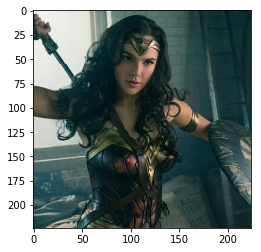

In [5]:
processed_img = utils.load_image('wonder-woman1.jpg')

plt.imshow(processed_img)
print('image shape: ', processed_img.shape)

In [6]:
processed_img_4d = processed_img[np.newaxis]
result = np.squeeze(softmax.eval(feed_dict={images: processed_img_4d, train_mode:False}))


In [7]:
W_vgg = vgg.data_dict['conv1_1'][0]
print(W_vgg.shape)

(3, 3, 3, 64)


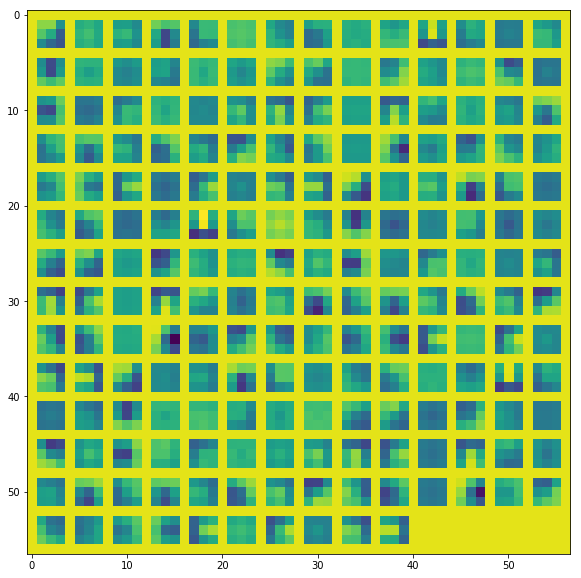

In [8]:
W_montage = utils.montage_filters(W_vgg)
plt.figure(figsize=(10,10))
plt.imshow(W_montage, interpolation='nearest')

## Visualizing Convolutional Output

In [9]:
vgg_conv1_1 = vgg.conv1_1.eval(feed_dict={images: processed_img_4d, train_mode:False}) 
vgg_conv2_1 = vgg.conv2_1.eval(feed_dict={images: processed_img_4d, train_mode:False})
vgg_conv5_1 = vgg.conv5_1.eval(feed_dict={images: processed_img_4d, train_mode:False})

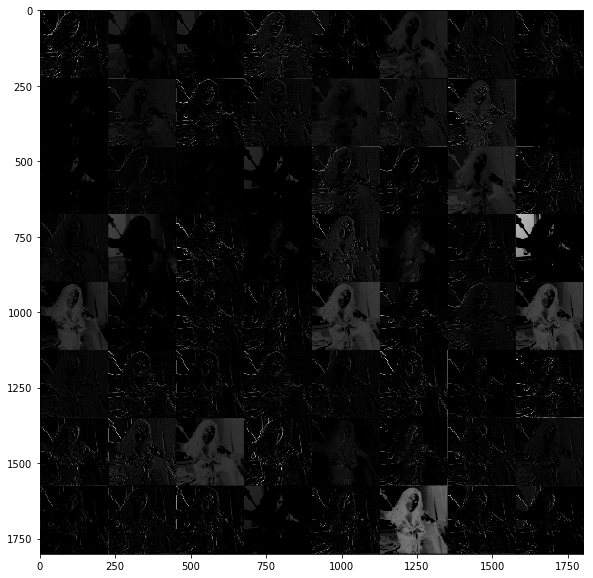

In [10]:
feature = vgg_conv1_1
montage = utils.montage_filters(np.rollaxis(np.expand_dims(feature[0], 3), 3, 2))
plt.figure(figsize=(10, 10))
plt.imshow(montage, cmap='gray')

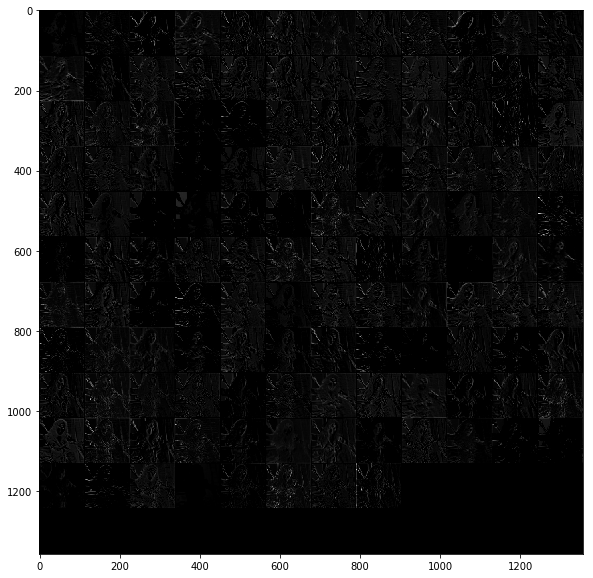

In [11]:
feature = vgg_conv2_1
montage = utils.montage_filters(np.rollaxis(np.expand_dims(feature[0], 3), 3, 2))
plt.figure(figsize=(10, 10))
plt.imshow(montage, cmap='gray')

In [12]:
layer_shape = tf.shape(feature).eval(feed_dict={images:processed_img_4d, train_mode:False})
print(layer_shape)

[  1 112 112 128]


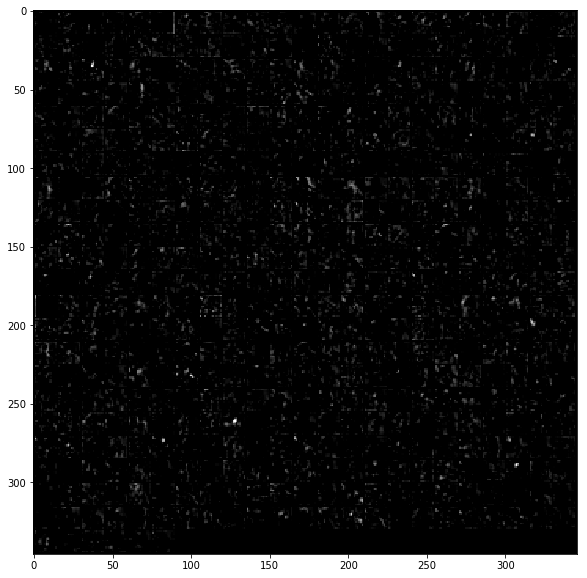

In [13]:
feature = vgg_conv5_1
montage = utils.montage_filters(np.rollaxis(np.expand_dims(feature[0], 3), 3, 2))
plt.figure(figsize=(10, 10))
plt.imshow(montage, cmap='gray')

In [14]:
feature = vgg.conv4_2
gradient = tf.gradients(tf.reduce_max(feature, axis=3), images)

In [15]:
res = sess.run(gradient, feed_dict={images: processed_img_4d, train_mode:True})[0]
print(np.min(res[0]), np.max(res[0]))

-13961.209 11919.242


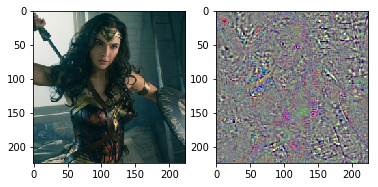

<Figure size 720x720 with 0 Axes>

In [16]:
res_normalized = utils.normalize(res)

fig, axs = plt.subplots(1, 2)
plt.figure(figsize=(10,10))
axs[0].imshow(processed_img)
axs[1].imshow(res_normalized[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


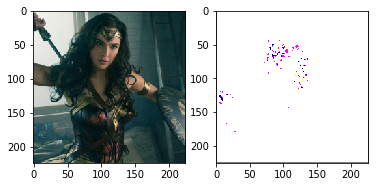

In [17]:
def compute_gradient_single_neuron(feature, neuron_i):
    '''visualize a single neuron in a layer, with neuron_i specifying the index of the neuron'''
    gradient = tf.gradients(tf.reduce_mean(feature[:, :, :, neuron_i]), images)
    res = sess.run(gradient, feed_dict={images: processed_img_4d, train_mode: False})[0]
    return res

gradient = compute_gradient_single_neuron(vgg.conv5_2, 77)
gradient_norm = utils.normalize(gradient)
montage = utils.montage(np.array(gradient_norm))
fig, axs = plt.subplots(1, 2)
axs[0].imshow(processed_img)
axs[1].imshow(montage)

## A Neural Algorithm of Artistic Style


In [18]:
import os
import tensorflow as tf
import numpy as np
import scipy.io

content_directory = 'contents/'
style_directory = 'styles/'

# This is the directory to store the final stylized images
output_directory = 'image_output/'
if not os.path.exists(output_directory):
  os.makedirs(output_directory)
    
# This is the directory to store the half-done images during the training.
checkpoint_directory = 'checkpoint_output/'
if not os.path.exists(checkpoint_directory):
  os.makedirs(checkpoint_directory)
    
content_path = os.path.join(content_directory, 'wonder-woman.jpg')
style_path = os.path.join(style_directory, 'starry-night.jpg')
output_path = os.path.join(output_directory, 'wonder-woman-starry-night-iteration-1000.jpg')

# please notice that the checkpoint_images_path has to contain %s in the file_name
checkpoint_path = os.path.join(checkpoint_directory, 'wonder-woman-starry-night-iteration-1000-%s.jpg')

In [19]:
import tensorflow as tf
import numpy as np
import scipy.io
import os

VGG_MEAN = [103.939, 116.779, 123.68]

VGG19_LAYERS = (
  'conv1_1', 'relu1_1', 'conv1_2', 'relu1_2', 'pool1',

  'conv2_1', 'relu2_1', 'conv2_2', 'relu2_2', 'pool2',

  'conv3_1', 'relu3_1', 'conv3_2', 'relu3_2', 'conv3_3',
  'relu3_3', 'conv3_4', 'relu3_4', 'pool3',

  'conv4_1', 'relu4_1', 'conv4_2', 'relu4_2', 'conv4_3',
  'relu4_3', 'conv4_4', 'relu4_4', 'pool4',

  'conv5_1', 'relu5_1', 'conv5_2', 'relu5_2', 'conv5_3',
  'relu5_3', 'conv5_4', 'relu5_4'
)


def net_preloaded(input_image, pooling):
  data_dict = np.load('libs/vgg19.npy', encoding='latin1').item()
  net = {}
  current = input_image
  for i, name in enumerate(VGG19_LAYERS):
    kind = name[:4]
    if kind == 'conv':
      kernels = get_conv_filter(data_dict, name)
      # kernels = np.transpose(kernels, (1, 0, 2, 3))

      bias = get_bias(data_dict, name)
      # matconvnet: weights are [width, height, in_channels, out_channels]
      # tensorflow: weights are [height, width, in_channels, out_channels]

      # bias = bias.reshape(-1)
      current = conv_layer(current, kernels, bias)
    elif kind == 'relu':
      current = tf.nn.relu(current)
    elif kind == 'pool':
      current = pool_layer(current, pooling)
    
    net[name] = current

  assert len(net) == len(VGG19_LAYERS)
  return net

def conv_layer(input, weights, bias):
  conv = tf.nn.conv2d(input, weights, strides=(1, 1, 1, 1), padding='SAME')
  return tf.nn.bias_add(conv, bias)


def pool_layer(input, pooling):
  if pooling == 'avg':
    return tf.nn.avg_pool(input, ksize=(1, 2, 2, 1), strides=(1, 2, 2, 1),
            padding='SAME')
  else:
    return tf.nn.max_pool(input, ksize=(1, 2, 2, 1), strides=(1, 2, 2, 1),
            padding='SAME')

# before we feed the image into the network, we preprocess it by 
# extracting the mean_pixel from it.
def preprocess(image):
  return image - VGG_MEAN

# remember to unprocess it before you plot it out and save it.
def unprocess(image):
  return image + VGG_MEAN

def get_conv_filter(data_dict, name):
  return tf.constant(data_dict[name][0], name="filter")

def get_bias(data_dict, name):
  return tf.constant(data_dict[name][1], name="biases")

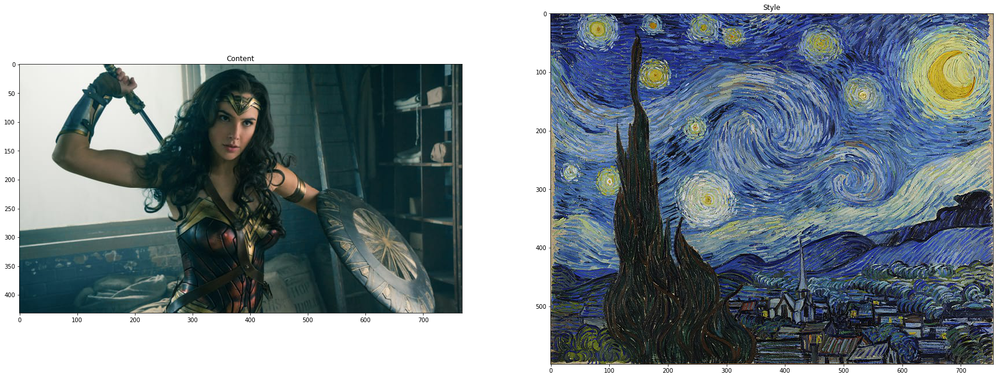

In [20]:
content_image = utils.loadImage(content_directory, 'wonder-woman1.jpg')
style_image = utils.loadImage(style_directory, 'starry-night.jpg')
utils.showImage(content_image, style_image)

## try 0
原始版本

In [21]:
import tensorflow as tf
import numpy as np
from functools import reduce
from PIL import Image

# feel free to try different layers
CONTENT_LAYERS = ('relu4_2', 'relu5_2')
STYLE_LAYERS = ('relu1_1', 'relu2_1', 'relu3_1', 'relu4_1', 'relu5_1')

VGG_MEAN = [103.939, 116.779, 123.68]

def stylize(content, styles, network_path='libs/imagenet-vgg-verydeep-19.mat', 
            iterations=1000, content_weight=5e0, content_weight_blend=0.5, style_weight=5e2, 
            style_layer_weight_exp=1,style_blend_weights=None, tv_weight=100,
            learning_rate=0.001, beta1=0.9, beta2=0.999, epsilon=1e-08, pooling='avg',
            print_iterations=100, checkpoint_iterations=100, checkpoint_path=None,
            output_path=None):
    
    
  shape = (1,) + content.shape                             #content image shape : (1,433,770,3)
  style_shapes = [(1,) + style.shape for style in styles]  #style image shape : (1,600,800,3)
  content_features = {}
  style_features = [{} for _ in styles]

    
  # scale the importance of each style layers according to their depth. 
  # (deeper layers are more important if style_layers_weights > 1 (default = 1))
  layer_weight = 1.0
  style_layers_weights = {}                                # weight for different network layers
  for style_layer in STYLE_LAYERS:                                    
    style_layers_weights[style_layer] = layer_weight       #'relu1_1','relu2_1',...,'relu5_1'
    layer_weight *= style_layer_weight_exp                 # 1.0

        
  # normalize style layer weights
  layer_weights_sum = 0
  for style_layer in STYLE_LAYERS:                         #'relu1_1',..., 'relu5_1'
    layer_weights_sum += style_layers_weights[style_layer] # 5.0
  for style_layer in STYLE_LAYERS:
    style_layers_weights[style_layer] /= layer_weights_sum

        
  # FEATURE MAPS FROM CONTENT IMAGE
  # compute the feature map of the content image by feeding it into the network
  #the output net contains the features of each content layer
  g = tf.Graph()
  with g.as_default(), tf.Session() as sess:
    image = tf.placeholder('float', shape=shape)

    net = net_preloaded(image, pooling)             # {'conv1_1':Tensor,relu1_1:Tensor...}
    content_pre = np.array([preprocess(content)])   # (1,433,770,3) subtract the mean pixel
    for layer in CONTENT_LAYERS:                    #'relu4_2', 'relu5_2'
      content_features[layer] = net[layer].eval(feed_dict={image: content_pre})  

            
  # FEATURE MAPS (GRAM MATRICES) FROM STYLE IMAGE
  # compute style features of the style image by feeding it into the network
  # and calculate the gram matrix
  for i in range(len(styles)):
    g = tf.Graph()
    with g.as_default(), tf.Session() as sess:
      image = tf.placeholder('float', shape=style_shapes[i])
      net = net_preloaded(image, pooling)                           
      style_pre = np.array([preprocess(styles[i])])
      for layer in STYLE_LAYERS:              #'relu1_1', 'relu2_1',..., 'relu5_1'
        features = net[layer].eval(feed_dict={image: style_pre})  # relu_1:(1,600,800,64)
        features = np.reshape(features, (-1, features.shape[3]))  # (480000, 64)
        gram = np.matmul(features.T, features) / features.size    # (64,64)
        style_features[i][layer] = gram

                
  # make stylized image using backpropogation
  with tf.Graph().as_default():

    # Generate a random image (the output image) with the same shape as the content image
    initial = tf.random_normal(shape) * 0.256  
    image = tf.Variable(initial)
    net = net_preloaded(image, pooling)
    

    # CONTENT LOSS
    # we can adjust the weight of each content layers
    # content_weight_blend is the ratio of two used content layers in this example
    content_layers_weights = {}
    content_layers_weights['relu4_2'] = content_weight_blend 
    content_layers_weights['relu5_2'] = 1.0 - content_weight_blend      

    content_loss = 0
    content_losses = []
    for content_layer in CONTENT_LAYERS:
      # Use MSE as content losses
      # content weight is the coefficient for content loss
      content_losses.append(content_layers_weights[content_layer] * content_weight * 
              (2 * tf.nn.l2_loss(net[content_layer] - content_features[content_layer]) /
              content_features[content_layer].size))
    content_loss += reduce(tf.add, content_losses)



    # STYLE LOSS
    # We can specify different weight for different style images
    # style_layers_weights => weight for different network layers
    # style_blend_weights => weight between different style images

    if style_blend_weights is None:
      style_blend_weights = [1.0/len(styles) for _ in styles]
    else:
      total_blend_weight = sum(style_blend_weights)
      # normalization
      style_blend_weights = [weight/total_blend_weight
                             for weight in style_blend_weights]


    style_loss = 0
    # iterate to calculate style loss with multiple style images
    for i in range(len(styles)):
      style_losses = []
      for style_layer in STYLE_LAYERS:             # e.g. relu1_1
        layer = net[style_layer]                   # relu1_1 of output image:(1,433,770,64)
        _, height, width, number = map(lambda i: i.value, layer.get_shape())  
        size = height * width * number
        feats = tf.reshape(layer, (-1, number))    # (333410,64)

        # Gram matrix for the features in relu1_1 of the output image.
        gram = tf.matmul(tf.transpose(feats), feats) / size
        # Gram matrix for the features in relu1_1 of the style image
        style_gram = style_features[i][style_layer]   

        # Style loss is the MSE for the difference of the 2 Gram matrices
        style_losses.append(style_layers_weights[style_layer] * 2 * 
                            tf.nn.l2_loss(gram - style_gram) / style_gram.size)
      style_loss += style_weight * style_blend_weights[i] * reduce(tf.add, style_losses)


    # TOTAL VARIATION LOSS  
    # Total variation denoising to do smoothing; cost to penalize neighboring pixel
    # not used by the original paper by Gatys et al
    # According to the paper Mahendran, Aravindh, and Andrea Vedaldi. "Understanding deep 
    # image representations by inverting them."
    # Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition. 2015.
    tv_y_size = _tensor_size(image[:,1:,:,:])
    tv_x_size = _tensor_size(image[:,:,1:,:])
    tv_loss = tv_weight * 2 * (
      (tf.nn.l2_loss(image[:,1:,:,:] - image[:,:shape[1]-1,:,:]) /
          tv_y_size) +
      (tf.nn.l2_loss(image[:,:,1:,:] - image[:,:,:shape[2]-1,:]) /
          tv_x_size))


    #OVERALL LOSS
    loss = content_loss + style_loss + tv_loss

    train_step = tf.train.AdamOptimizer(learning_rate, beta1, beta2, epsilon).minimize(loss)

    def print_progress():
      print('     iteration: %d\n' % i)
      print('  content loss: %g\n' % content_loss.eval())
      print('    style loss: %g\n' % style_loss.eval())
      print('       tv loss: %g\n' % tv_loss.eval())
      print('    total loss: %g\n' % loss.eval())

    def imsave(path, img):
      img = np.clip(img, 0, 255).astype(np.uint8)
      Image.fromarray(img).save(path, quality=95)

    
    
    # TRAINING
    best_loss = float('inf')
    best = None
    
    with tf.Session() as sess:
        
      sess.run(tf.global_variables_initializer())
    
      if (print_iterations and print_iterations != 0):
        print_progress()
        
      for i in range(iterations):

        train_step.run()

        last_step = (i == iterations - 1)
        if last_step or (print_iterations and i % print_iterations == 0):
          print_progress()

        # store output and checkpoint images
        if (checkpoint_iterations and i % checkpoint_iterations == 0) or last_step:
          this_loss = loss.eval()
          if this_loss < best_loss:
            best_loss = this_loss
            best = image.eval()

          img_out = unprocess(best.reshape(shape[1:]))

          output_file = None
          if not last_step:
            if checkpoint_path:
                output_file = checkpoint_path % i
          else:
            output_file = output_path

          if output_file:
            imsave(output_file, img_out)
            
  print("finish stylizing.")



def _tensor_size(tensor):
  from operator import mul
  return reduce(mul, (d.value for d in tensor.get_shape()), 1)

In [22]:
checkpoint_path=None
output_path = output_directory + 'wonder-woman-starry-night-tvweight-100.jpg'

stylize(content_image, [style_image], iterations=1000,
        content_weight=5e0, content_weight_blend=1, style_weight=5e2, 
        style_layer_weight_exp=1, style_blend_weights=None, tv_weight=100,
        learning_rate=1e1, beta1=0.9, beta2=0.999, epsilon=1e-08, pooling='avg',
        print_iterations=100, checkpoint_iterations=100, checkpoint_path=checkpoint_path,
        output_path=output_path)

     iteration: 0

  content loss: 290237

    style loss: 2.32121e+06

       tv loss: 26.2523

    total loss: 2.61147e+06

     iteration: 0

  content loss: 280542

    style loss: 2.01055e+06

       tv loss: 15383.9

    total loss: 2.30648e+06

     iteration: 100

  content loss: 137608

    style loss: 31303.9

       tv loss: 54535.2

    total loss: 223447

     iteration: 200

  content loss: 121103

    style loss: 33100.4

       tv loss: 49676.4

    total loss: 203879

     iteration: 300

  content loss: 121234

    style loss: 28225.5

       tv loss: 48500.3

    total loss: 197960

     iteration: 400

  content loss: 119442

    style loss: 29413.6

       tv loss: 48388

    total loss: 197244

     iteration: 500

  content loss: 115472

    style loss: 35741.8

       tv loss: 47438.2

    total loss: 198651

     iteration: 600

  content loss: 117902

    style loss: 31803

       tv loss: 48322.1

    total loss: 198027

     iteration: 700

  content loss: 1

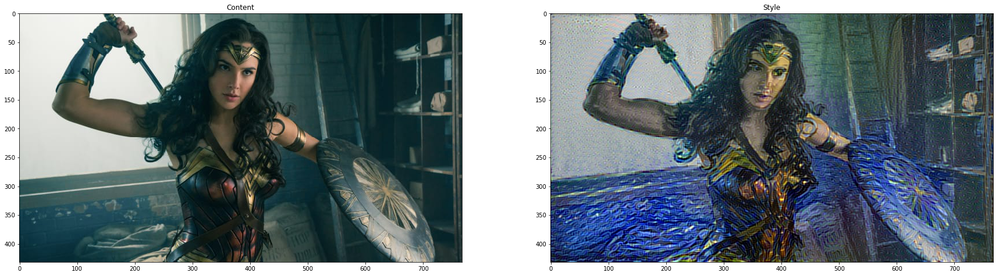

In [23]:
output_image0 = utils.loadImage(output_directory, 'wonder-woman-starry-night-tvweight-100.jpg')
utils.showImage(content_image, output_image0)

## Try 1
* 使用不同的layers
* CONTENT_LAYERS = ('relu3_2', 'relu4_2')
* STYLE_LAYERS = ('relu1_1', 'relu2_1', 'relu3_1', 'relu4_1')

In [24]:
import tensorflow as tf
import numpy as np
from functools import reduce
from PIL import Image

# feel free to try different layers
CONTENT_LAYERS = ('relu3_2', 'relu4_2')
STYLE_LAYERS = ('relu1_1', 'relu2_1', 'relu3_1', 'relu4_1')

VGG_MEAN = [103.939, 116.779, 123.68]

def stylize(content, styles, network_path='libs/imagenet-vgg-verydeep-19.mat', 
            iterations=1000, content_weight=5e0, content_weight_blend=0.5, style_weight=5e2, 
            style_layer_weight_exp=1,style_blend_weights=None, tv_weight=100,
            learning_rate=0.001, beta1=0.9, beta2=0.999, epsilon=1e-08, pooling='avg',
            print_iterations=100, checkpoint_iterations=100, checkpoint_path=None,
            output_path=None):
    
    
  shape = (1,) + content.shape                             #content image shape : (1,433,770,3)
  style_shapes = [(1,) + style.shape for style in styles]  #style image shape : (1,600,800,3)
  content_features = {}
  style_features = [{} for _ in styles]

    
  # scale the importance of each style layers according to their depth. 
  # (deeper layers are more important if style_layers_weights > 1 (default = 1))
  layer_weight = 1.0
  style_layers_weights = {}                                # weight for different network layers
  for style_layer in STYLE_LAYERS:                                    
    style_layers_weights[style_layer] = layer_weight       #'relu1_1','relu2_1',...,'relu5_1'
    layer_weight *= style_layer_weight_exp                 # 1.0

        
  # normalize style layer weights
  layer_weights_sum = 0
  for style_layer in STYLE_LAYERS:                         #'relu1_1',..., 'relu5_1'
    layer_weights_sum += style_layers_weights[style_layer] # 5.0
  for style_layer in STYLE_LAYERS:
    style_layers_weights[style_layer] /= layer_weights_sum

        
  # FEATURE MAPS FROM CONTENT IMAGE
  # compute the feature map of the content image by feeding it into the network
  #the output net contains the features of each content layer
  g = tf.Graph()
  with g.as_default(), tf.Session() as sess:
    image = tf.placeholder('float', shape=shape)

    net = net_preloaded(image, pooling)             # {'conv1_1':Tensor,relu1_1:Tensor...}
    content_pre = np.array([preprocess(content)])   # (1,433,770,3) subtract the mean pixel
    for layer in CONTENT_LAYERS:                    #'relu4_2', 'relu5_2'
      content_features[layer] = net[layer].eval(feed_dict={image: content_pre})  

            
  # FEATURE MAPS (GRAM MATRICES) FROM STYLE IMAGE
  # compute style features of the style image by feeding it into the network
  # and calculate the gram matrix
  for i in range(len(styles)):
    g = tf.Graph()
    with g.as_default(), tf.Session() as sess:
        image = tf.placeholder('float', shape=style_shapes[i])
        net = net_preloaded(image, pooling)                           
        style_pre = np.array([preprocess(styles[i])])
        for layer in STYLE_LAYERS:              #'relu1_1', 'relu2_1',..., 'relu5_1'
            features = net[layer].eval(feed_dict={image: style_pre})  # relu_1:(1,600,800,64)
            features = np.reshape(features, (-1, features.shape[3]))  # (480000, 64)
            gram = np.matmul(features.T, features) / features.size    # (64,64)
            style_features[i][layer] = gram

                
  # make stylized image using backpropogation
  with tf.Graph().as_default():

    # Generate a random image (the output image) with the same shape as the content image
    initial = tf.random_normal(shape) * 0.256  
    image = tf.Variable(initial)
    net = net_preloaded(image, pooling)
    

    # CONTENT LOSS
    # we can adjust the weight of each content layers
    # content_weight_blend is the ratio of two used content layers in this example
    content_layers_weights = {}
    content_layers_weights['relu3_2'] = content_weight_blend 
    content_layers_weights['relu4_2'] = 1.0 - content_weight_blend      

    content_loss = 0
    content_losses = []
    for content_layer in CONTENT_LAYERS:
      # Use MSE as content losses
      # content weight is the coefficient for content loss
        content_losses.append(content_layers_weights[content_layer] * content_weight * 
               (2 * tf.nn.l2_loss(net[content_layer] - content_features[content_layer]) /
               content_features[content_layer].size))
    content_loss += reduce(tf.add, content_losses)



    # STYLE LOSS
    # We can specify different weight for different style images
    # style_layers_weights => weight for different network layers
    # style_blend_weights => weight between different style images

    if style_blend_weights is None:
      style_blend_weights = [1.0/len(styles) for _ in styles]
    else:
      total_blend_weight = sum(style_blend_weights)
      # normalization
      style_blend_weights = [weight/total_blend_weight
                             for weight in style_blend_weights]


    style_loss = 0
    # iterate to calculate style loss with multiple style images
    for i in range(len(styles)):
      style_losses = []
      for style_layer in STYLE_LAYERS:             # e.g. relu1_1
        layer = net[style_layer]                   # relu1_1 of output image:(1,433,770,64)
        _, height, width, number = map(lambda i: i.value, layer.get_shape())  
        size = height * width * number
        feats = tf.reshape(layer, (-1, number))    # (333410,64)

        # Gram matrix for the features in relu1_1 of the output image.
        gram = tf.matmul(tf.transpose(feats), feats) / size
        # Gram matrix for the features in relu1_1 of the style image
        style_gram = style_features[i][style_layer]   

        # Style loss is the MSE for the difference of the 2 Gram matrices
        style_losses.append(style_layers_weights[style_layer] * 2 * 
                            tf.nn.l2_loss(gram - style_gram) / style_gram.size)
      style_loss += style_weight * style_blend_weights[i] * reduce(tf.add, style_losses)


    # TOTAL VARIATION LOSS  
    # Total variation denoising to do smoothing; cost to penalize neighboring pixel
    # not used by the original paper by Gatys et al
    # According to the paper Mahendran, Aravindh, and Andrea Vedaldi. "Understanding deep 
    # image representations by inverting them."
    # Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition. 2015.
    tv_y_size = _tensor_size(image[:,1:,:,:])
    tv_x_size = _tensor_size(image[:,:,1:,:])
    tv_loss = tv_weight * 2 * (
      (tf.nn.l2_loss(image[:,1:,:,:] - image[:,:shape[1]-1,:,:]) /
          tv_y_size) +
      (tf.nn.l2_loss(image[:,:,1:,:] - image[:,:,:shape[2]-1,:]) /
          tv_x_size))


    #OVERALL LOSS
    loss = content_loss + style_loss + tv_loss

    train_step = tf.train.AdamOptimizer(learning_rate, beta1, beta2, epsilon).minimize(loss)

    def print_progress():
      print('     iteration: %d\n' % i)
      print('  content loss: %g\n' % content_loss.eval())
      print('    style loss: %g\n' % style_loss.eval())
      print('       tv loss: %g\n' % tv_loss.eval())
      print('    total loss: %g\n' % loss.eval())

    def imsave(path, img):
      img = np.clip(img, 0, 255).astype(np.uint8)
      Image.fromarray(img).save(path, quality=95)

    
    
    # TRAINING
    best_loss = float('inf')
    best = None
    
    with tf.Session() as sess:
        
      sess.run(tf.global_variables_initializer())
    
      if (print_iterations and print_iterations != 0):
        print_progress()
        
      for i in range(iterations):

        train_step.run()

        last_step = (i == iterations - 1)
        if last_step or (print_iterations and i % print_iterations == 0):
          print_progress()

        # store output and checkpoint images
        if (checkpoint_iterations and i % checkpoint_iterations == 0) or last_step:
          this_loss = loss.eval()
          if this_loss < best_loss:
            best_loss = this_loss
            best = image.eval()

          img_out = unprocess(best.reshape(shape[1:]))

          output_file = None
          if not last_step:
            if checkpoint_path:
                output_file = checkpoint_path % i
          else:
            output_file = output_path

          if output_file:
            imsave(output_file, img_out)
            
  print("finish stylizing.")



def _tensor_size(tensor):
  from operator import mul
  return reduce(mul, (d.value for d in tensor.get_shape()), 1)

In [25]:
stylize(content_image, [style_image], iterations=1000,
        content_weight=5e0, 
        content_weight_blend=1, 
        style_weight=5e2, 
        style_layer_weight_exp=1, style_blend_weights=None, tv_weight=100,
        learning_rate=1e1, beta1=0.9, beta2=0.999, epsilon=1e-08, pooling='avg',
        print_iterations=100, checkpoint_iterations=100, checkpoint_path=checkpoint_path,
        output_path=output_path)

     iteration: 0

  content loss: 79808.2

    style loss: 2.90149e+06

       tv loss: 26.2342

    total loss: 2.98133e+06

     iteration: 0

  content loss: 74189.2

    style loss: 2.47435e+06

       tv loss: 16487

    total loss: 2.56503e+06

     iteration: 100

  content loss: 64290.7

    style loss: 33172.9

       tv loss: 53756.8

    total loss: 151220

     iteration: 200

  content loss: 50136.7

    style loss: 13931.3

       tv loss: 49543.1

    total loss: 113611

     iteration: 300

  content loss: 49170.4

    style loss: 18440.4

       tv loss: 50879.8

    total loss: 118491

     iteration: 400

  content loss: 44834.1

    style loss: 13244.6

       tv loss: 47981.1

    total loss: 106060

     iteration: 500

  content loss: 44873.6

    style loss: 13541.1

       tv loss: 48903

    total loss: 107318

     iteration: 600

  content loss: 43601.8

    style loss: 13228.1

       tv loss: 47728.5

    total loss: 104558

     iteration: 700

  content

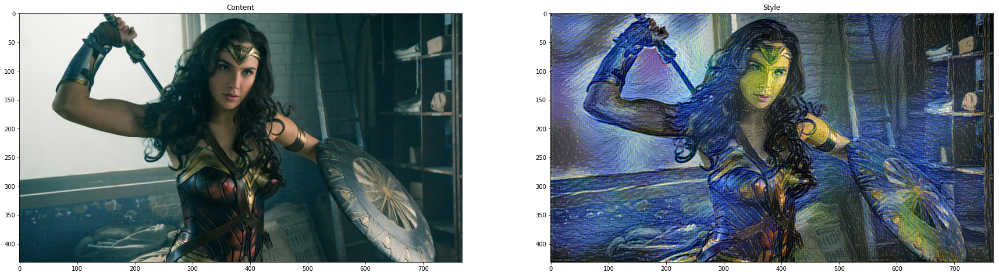

In [26]:
output_image1 = utils.loadImage(output_directory, 'wonder-woman-starry-night-tvweight-100.jpg')
utils.showImage(content_image, output_image1)

## try 2 

* 使用 try 1 的layers
* content_weight=3
* style_weight=7
* tv_weight=100

In [27]:
stylize(content_image, [style_image], iterations=1000,
        content_weight=3, 
        content_weight_blend=1, 
        style_weight=7, 
        style_layer_weight_exp=1, style_blend_weights=None, tv_weight=100,
        learning_rate=1e1, beta1=0.9, beta2=0.999, epsilon=1e-08, pooling='avg',
        print_iterations=100, checkpoint_iterations=100, checkpoint_path=checkpoint_path,
        output_path=output_path)

     iteration: 0

  content loss: 47887.7

    style loss: 40620.9

       tv loss: 26.1833

    total loss: 88534.8

     iteration: 0

  content loss: 43362.4

    style loss: 36233.8

       tv loss: 17968

    total loss: 97564.1

     iteration: 100

  content loss: 8287.97

    style loss: 12936.6

       tv loss: 6139.06

    total loss: 27363.6

     iteration: 200

  content loss: 7161.39

    style loss: 12716.8

       tv loss: 5956.68

    total loss: 25834.8

     iteration: 300

  content loss: 6743.2

    style loss: 12700.6

       tv loss: 5915.4

    total loss: 25359.2

     iteration: 400

  content loss: 6651.66

    style loss: 12623.5

       tv loss: 5906.66

    total loss: 25181.8

     iteration: 500

  content loss: 6556.78

    style loss: 12648.9

       tv loss: 5870.03

    total loss: 25075.7

     iteration: 600

  content loss: 6510.99

    style loss: 12665.4

       tv loss: 5841.2

    total loss: 25017.6

     iteration: 700

  content loss: 6455

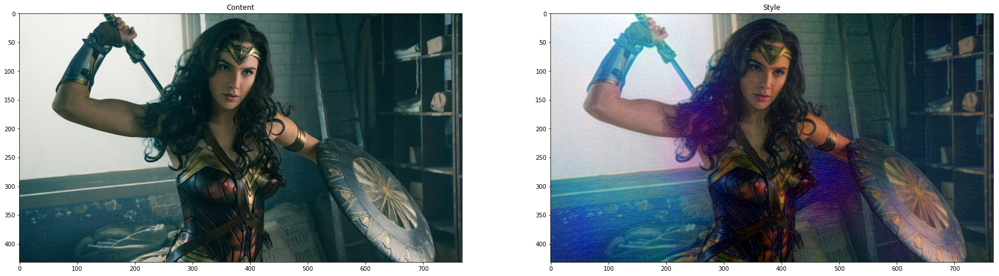

In [28]:
output_image2 = utils.loadImage(output_directory, 'wonder-woman-starry-night-tvweight-100.jpg')
utils.showImage(content_image, output_image2)

## try 3 

* 使用 try 1 的layers
* content_weight=5
* style_weight=1000
* tv_weight=300

In [29]:
stylize(content_image, [style_image], iterations=1000,
        content_weight=5 ,
        content_weight_blend=1, 
        style_weight=1000,
        style_layer_weight_exp=1, style_blend_weights=None, 
        tv_weight=300,
        learning_rate=1e1, beta1=0.9, beta2=0.999, epsilon=1e-08, pooling='avg',
        print_iterations=100, checkpoint_iterations=100, checkpoint_path=checkpoint_path,
        output_path=output_path)

     iteration: 0

  content loss: 79810.1

    style loss: 5.80298e+06

       tv loss: 78.8133

    total loss: 5.88287e+06

     iteration: 0

  content loss: 74290.3

    style loss: 4.92048e+06

       tv loss: 47918.6

    total loss: 5.04269e+06

     iteration: 100

  content loss: 85159.1

    style loss: 48158.4

       tv loss: 139107

    total loss: 272425

     iteration: 200

  content loss: 68886.2

    style loss: 36470

       tv loss: 129505

    total loss: 234861

     iteration: 300

  content loss: 61381.4

    style loss: 32609.7

       tv loss: 124106

    total loss: 218097

     iteration: 400

  content loss: 63133.6

    style loss: 34988.6

       tv loss: 136846

    total loss: 234968

     iteration: 500

  content loss: 56728.6

    style loss: 45927.9

       tv loss: 121751

    total loss: 224408

     iteration: 600

  content loss: 56650.7

    style loss: 32274.2

       tv loss: 123577

    total loss: 212502

     iteration: 700

  content los

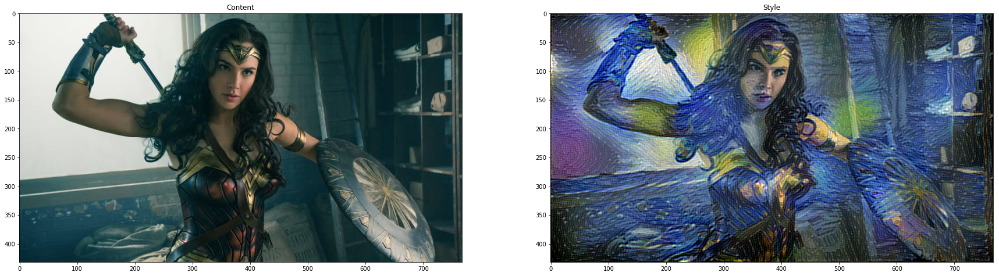

In [30]:
output_image3 = utils.loadImage(output_directory, 'wonder-woman-starry-night-tvweight-100.jpg')
utils.showImage(content_image, output_image3)

## Compare

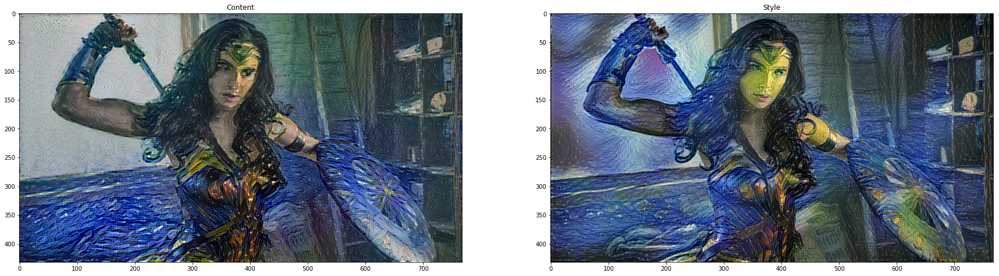

In [31]:
utils.showImage(output_image0, output_image1)

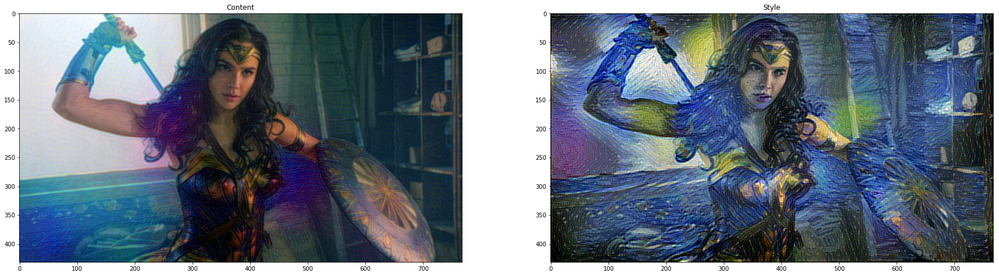

In [32]:
utils.showImage(output_image2, output_image3)

## Report

1.使用不同的layers,由於content_image使用比較前面的layers學習到的輪廓會比較清晰一點。這點在loss方面也顯現得出來 content loss 從118903降到41863.4。(見compare左上圖和右上圖)

2.在相同的layers下，使用不同的weight可明顯的看出各圖的輪廓一致，差異只在與style_image的相近程度，style weight越大style_image的效果越明顯，content loss和style loss也會越大。(見compare右上圖、左下圖和右下圖)

--------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------
測試的組合以及loss情形:


1.compare左上圖
* content layers = ('relu4_2', 'relu5_2')
* style layers = ('relu1_1', 'relu2_1', 'relu3_1', 'relu4_1', 'relu5_1') 
* content_weight = 5, style_weight = 500, tv_weight = 100
* content loss: 118903, style loss: 31180.2, tv loss: 47794.6, total loss: 197878

2.compare右上圖
* content layers = ('relu3_2', 'relu4_2')
* style layers = ('relu1_1', 'relu2_1', 'relu3_1', 'relu4_1') 
* content_weight = 5, style_weight = 500, tv_weight = 100
* content loss: 41863.4, style loss: 19601.7, tv loss: 46745.7, total loss: 108211

3.compare左下圖
* content layers = ('relu3_2', 'relu4_2')
* style layers = ('relu1_1', 'relu2_1', 'relu3_1', 'relu4_1') 
* content_weight = 3, style_weight = 7, tv_weight = 100
* content loss: 6279, style loss: 12652.6, tv loss: 5830.7, total loss: 24762.3

4.compare右下圖
* content layers = ('relu3_2', 'relu4_2')
* style layers = ('relu1_1', 'relu2_1', 'relu3_1', 'relu4_1') 
* content_weight = 5, style_weight = 1000, tv_weight = 300
* content loss: 54499.2, style loss: 31396.4, tv loss: 121805, total loss: 207700
